# Practica Final Asignatura Deep Learning

En este Notebook se entrenan modelos para abordar un problema de vision artificial.

Se dispone de un conjunto de imagenes, que contiene un total de 1027 imagenes de bandejas que incluyen diferentes comidas, con una dimension espacial de 3264 x 2448 pixeles en RGB. Para cada una de las imagenes, se ha calculado el porcentaje de pixeles que contienen comida.

Partiendo de estos pares (imagen, porcentaje), se pide definir y entrenar modelos basados en redes convolucionales (CNNs) que, dada una imagen, proporcionen el porcentaje de pixelesde comida de la misma.

La calidad de los modelos se estimará utilizando el error cuadratico medio (MSE) o la raiz del error cuadratico medio (RMSE).

En concreto, se implementaran tres aproximaciones que se compararan con un baseline cuyo RMSE = 4.8.

Las 3 aproximaciones que se van a realizar serán las siguientes:

* Modelo Simple, sin mejoras, para delimitar una base para el problema.
* Segunda iteración del primer modelo, aplicando mejoras para evitar sobreajuste, mejorar entrenamiento y mejorar RMSE.
* Modelo ya existente, empleando transfer learning para adapatar el modelo al problema.

Se importan las librerias necesarias para la implementacion de los modelos


In [ ]:
import pandas as pd
import numpy as np

from google.colab import drive

from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

from tensorflow.keras import applications, optimizers, regularizers
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.utils import plot_model

from tensorflow.keras.models import Model, load_model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array


Se monta el drive y obtenemos los datos.

Para que se pueda acceder a los datos es necesario que estén en el Drive, en concreto deben estar en la siguiente ruta:

***DL_master/DL_UNIMIB2016.zip***

In [ ]:
# Montamos el Google Drive en el directorio del proyecto y descomprimios el fichero con los datos
drive.mount('/content/gdrive')
!unzip -n '/content/gdrive/MyDrive/DL_master/DL_UNIMIB2016.zip' >> /dev/null

# Especificamos los paths al directorio que contiene las imagenes y al fichero con los porcentajes
data_path = 'UNIMIB2016/'
images_path = data_path + "images/"
percentages_path = data_path + "percentage.csv"

Mounted at /content/gdrive


Se dividen los datos en particioines train/validation/test y se preprocesan los datos.

Para el preprocesado simplemente se normalizan los coeficientes RGB de las imagenes a una escala [0,1].

Tambien se define el tamaño de los batches en 16. Sería posible subrilo a 32, pero es psoible que durante el entrenamiento se alcance el limite de memoria RAM disponible en el backend de Google y que se aborte la ejecución, por lo tanto se decide el tamaño del batch en 16.

Finalmente se crean los datagen de train, Validation y test.

In [ ]:
# Se lee el fichero CSV con los porcentajes
percentages = pd.read_csv(percentages_path, dtype =  {"food_pixels": "float64"})

# Se crean las tres particiones de datos: entrenamiento, validación y test
seed = 0
train_data, test_data = train_test_split(percentages, test_size=0.3, random_state=seed)
dev_data, test_data = train_test_split(test_data, test_size=0.5, random_state=seed)

# Se actualizan los indices de cada particion
train_data = train_data.reset_index(drop=True)
dev_data = dev_data.reset_index(drop=True)
test_data = test_data.reset_index(drop=True)

# Se preparan los datos utilizando normalización (rescale)
datagen = ImageDataGenerator(rescale=1./255)

# Se especifican una serie de parámetros dependientes del conjunto de datos
img_width = img_height = 224  # dimensiones de la imagen, 224x224x3 porque es un tamaño bastante habitual cuando se utilizan redes pre-entrenadas (por ejemplo, los modelos pre-entrenados con ImageNet de VGG, ResNet o DenseNet)
x_col = 'image_name'          # nombres de las columnas en el fichero CSV
y_col = 'food_pixels'


# Se generan los batches con los datos para las tres particiones
batch_size = 16              # tamaño del batch
train_generator = datagen.flow_from_dataframe(
    dataframe=train_data,
    directory=images_path,
    x_col=x_col,
    y_col=y_col,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='other',     # 'other' ya que no es un problema de clasificación sino de regresion
    seed=seed
)

dev_generator = datagen.flow_from_dataframe(
    dataframe=dev_data,
    directory=images_path,
    x_col=x_col,
    y_col=y_col,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='other',
    seed=seed
)

test_generator = datagen.flow_from_dataframe(
    dataframe=test_data,
    directory=images_path,
    x_col=x_col,
    y_col=y_col,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='other',
    seed=seed
)

Found 718 validated image filenames.
Found 154 validated image filenames.
Found 155 validated image filenames.


## **MODELO 1: Se genera la primera red CNN**

Las primeras capas convolucionales se crean con un numero bajo de filtros y la cantidad de filtros aumenta en capas más profundas. De este modo las primeras capas están destinadas a capturar características simples y locales, mientras que las capas más profundas se encargan de aprender características más complejas y abstractas.

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 8)       224       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 16)      1168      
                                                                 
 max_pooling2d (MaxPooling2  (None, 110, 110, 16)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 32)      4640      
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 32)      9248      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 32)        0         
 g2D)                                                   

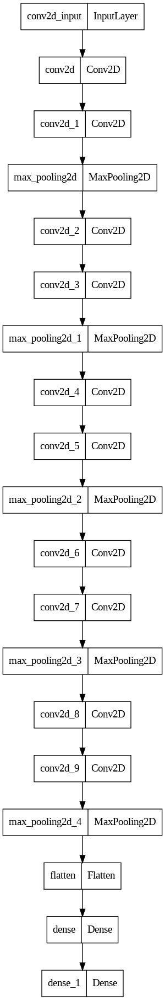

In [ ]:
# Se define el Modelo CNN
model = Sequential()
model.add(Conv2D(8, 3, activation='relu', input_shape=(img_width, img_height, 3)))
model.add(Conv2D(16, 3, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(32, 3, activation='relu'))
model.add(Conv2D(32, 3, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(64, 3, activation='relu'))
model.add(Conv2D(64, 3, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(128, 3, activation='relu'))
model.add(Conv2D(128, 3, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(256, 3, activation='relu'))
model.add(Conv2D(256, 3, activation='relu'))
model.add(MaxPooling2D())

model.add(Flatten()) # Se opta por una capa GlobalAveragePooling en lugar de Flatten para reducir la dimensionalidad
model.add(Dense(1024, activation='relu')) # Capa completamente conectada
model.add(Dense(1))  # Salida para la regresión

# Se imprime la representacion en modo texto e imagen del modelo
model.summary()
plot_model(model, to_file='model.png')

In [ ]:
# Se compila el Modelo
# Se emplea el optimizador Adam y como metrica se emplea RMSE
model.compile(optimizer=optimizers.Adam(learning_rate=0.0001), loss='mse', metrics=[RootMeanSquaredError()])

# Se entrena el Modelo
model_history = model.fit(train_generator,
          epochs=10,
          verbose=2,
          steps_per_epoch=len(train_data)/batch_size,
          validation_data=dev_generator,
          validation_steps=len(dev_data)/batch_size)

print()
test_loss, test_acc = model.evaluate(test_generator,
                                     steps=len(test_data)/batch_size,
                                     verbose=1)
print("test_loss: %.4f, test_acc: %.4f" % (test_loss, test_acc))

Epoch 1/10
44/44 - 102s - loss: 88.9664 - root_mean_squared_error: 9.4322 - val_loss: 35.6235 - val_root_mean_squared_error: 5.9685 - 102s/epoch - 2s/step
Epoch 2/10
44/44 - 98s - loss: 26.1589 - root_mean_squared_error: 5.1146 - val_loss: 41.8177 - val_root_mean_squared_error: 6.4667 - 98s/epoch - 2s/step
Epoch 3/10
44/44 - 104s - loss: 23.8986 - root_mean_squared_error: 4.8886 - val_loss: 33.1029 - val_root_mean_squared_error: 5.7535 - 104s/epoch - 2s/step
Epoch 4/10
44/44 - 106s - loss: 22.8190 - root_mean_squared_error: 4.7769 - val_loss: 35.1749 - val_root_mean_squared_error: 5.9308 - 106s/epoch - 2s/step
Epoch 5/10
44/44 - 101s - loss: 22.1413 - root_mean_squared_error: 4.7055 - val_loss: 29.4180 - val_root_mean_squared_error: 5.4238 - 101s/epoch - 2s/step
Epoch 6/10
44/44 - 101s - loss: 22.0851 - root_mean_squared_error: 4.6995 - val_loss: 29.4538 - val_root_mean_squared_error: 5.4271 - 101s/epoch - 2s/step
Epoch 7/10
44/44 - 104s - loss: 21.1161 - root_mean_squared_error: 4.595

Para poder observar la evolucion del modelo y determinar si esta sobreajustando o no, se definen funciones para representar la evolucion del RMSE en los epochs en un gráfico.

Se parte de una función presentada en los notebooks de la asignatura:

In [ ]:
def plot_history(history):
  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel('Error cuadrático medio')
  plt.plot(history.epoch, np.array(history.history['loss']),
           label='Error (loss) en entrenamiento')
  plt.legend()
  plt.ylim([0, max(1,max(np.array(history.history['loss'])))])

La funcion de modifica para que sea mas sencillo comparar el RMSE de entrenamiento y el RMSE en validación para determinar si se está sobreajustando el modelo, para ello se dibujan ambas metricas (Entrenamiento y Validacion) en el mismo gráfico, adicionalmente se añade un parametro a la funcion para que se pueda escoger la metrica a visualizar pasandola como argumento a la funcion.

In [ ]:
def plot_overfitting_check(history, metric):
  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel(metric)
  plt.plot(history.epoch, np.array(history.history[metric]),
           label=f'Error ({metric}) en entrenamiento')
  plt.plot(history.epoch, np.array(history.history['val_' + metric]),
           label=f'Error (val_{metric}) en validación')
  plt.legend()
  plt.ylim([0, max(1,max(np.array(history.history[metric])), max(np.array(history.history['val_' + metric])))])

Se llama a la funcion, especificando la metrica "root_mean_squared_error":

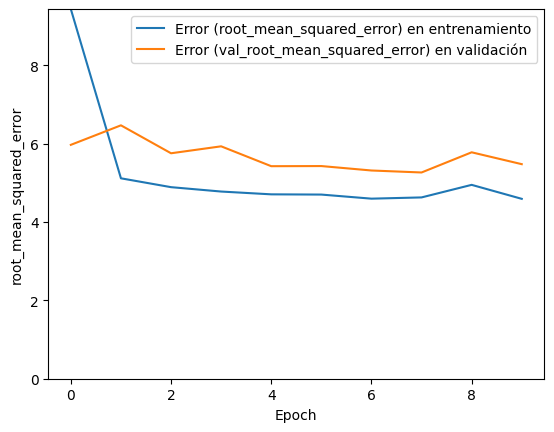

In [ ]:
plot_overfitting_check(model_history, 'root_mean_squared_error')

In [ ]:
print("Máximo RMSE:",max(np.array(model_history.history['val_root_mean_squared_error'])))
print("Mínimo RMSE:",min(np.array(model_history.history['val_root_mean_squared_error'])))

Máximo RMSE: 6.4666643142700195
Mínimo RMSE: 5.263333797454834


## **Modelo 2: Modelo 1 con mejoras**

 El segundo modelo es una evolucion del primero, donde se intenta mejorar el modelo basandose en los resultados obtenidos, se espera mejorar los resultados del modelo emepleando tecnicas como inicializacion de pesos, dropout, early stopping, etc.

Los cambios realizados sobre el modelo son:

* Se elimina uno de los bloques de capas Conv2d y MaxPooling, la razon es que al simplificar el modelo se espera que no sobre ajuste al problema.
* Se substituye la capa Flatten por una GlobalAveragePooling2D.
* Se reduce el numero de neuronas de la capa completamente conectada.
* Se añade una segunda capa completamente conectada antes de la salida del modelo.

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_26 (Conv2D)          (None, 222, 222, 8)       224       
                                                                 
 conv2d_27 (Conv2D)          (None, 220, 220, 16)      1168      
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 110, 110, 16)      0         
 ng2D)                                                           
                                                                 
 conv2d_28 (Conv2D)          (None, 108, 108, 32)      4640      
                                                                 
 conv2d_29 (Conv2D)          (None, 106, 106, 32)      9248      
                                                                 
 max_pooling2d_14 (MaxPooli  (None, 53, 53, 32)        0         
 ng2D)                                                

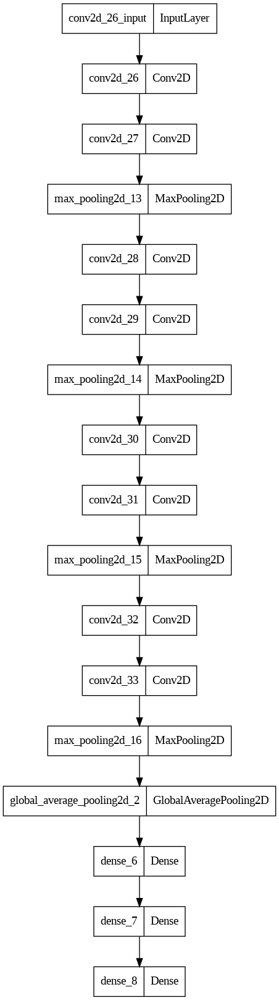

In [ ]:
# Se define el Modelo CNN
model2 = Sequential()
model2.add(Conv2D(8, 3, activation='relu', input_shape=(img_width, img_height, 3)))
model2.add(Conv2D(16, 3, activation='relu'))
model2.add(MaxPooling2D())

model2.add(Conv2D(32, 3, activation='relu'))
model2.add(Conv2D(32, 3, activation='relu'))
model2.add(MaxPooling2D())

model2.add(Conv2D(64, 3, activation='relu'))
model2.add(Conv2D(64, 3, activation='relu'))
model2.add(MaxPooling2D())

# Se decide eliminar uno de los bloques del modelo para reducir su complegidad y evitar posibles sobreajustes

model2.add(Conv2D(128, 3, activation='relu'))
model2.add(Conv2D(256, 3, activation='relu'))
model2.add(MaxPooling2D())

model2.add(GlobalAveragePooling2D()) # Se opta por una capa GlobalAveragePooling en lugar de Flatten para reducir la dimensionalidad
model2.add(Dense(512, activation='relu'))
model2.add(Dense(512, activation='relu'))
model2.add(Dense(1))  # Salida para la regresión

# Imprimimos la representacion en modo texto del modelo
model2.summary()
plot_model(model2, to_file='model2.png')

Parte de los cambios respecto al modelo anterior son durante el entrenamiento.

En el primer modelo, al tratarse de una base sobre la que mejorar, no se tubieron en cuenta mejoras durante el entrenamiento del modelo para mejorar los resultado y, sobretodo, para evitar sobreajustes.

En el segundo modelo, se han implementado diferentes medidas para mejorar el modelo:

* Se ha implementado Learning Rate Decay (ReduceLROnPlateau)
* Se ha implementado Eraly Stopping, para que se detenga el entrenamiento si se detecta que el modelo está empezando a sobreajustarse.

In [ ]:
# Se compila el modelo
initial_learning_rate = 0.0001
reduce_lr = ReduceLROnPlateau(monitor='val_root_mean_squared_error', factor=0.1, patience=2, min_lr=0.0000001, verbose=1,  min_delta=0.1)
model2.compile(optimizer=optimizers.Adam(learning_rate=initial_learning_rate), loss='mse', metrics=[RootMeanSquaredError()])

# Se añade early stopping para evitar sobreajustes
early_stopping = EarlyStopping(monitor='val_root_mean_squared_error', patience=3, verbose=1,  min_delta=0.3)
print()

# Se entrena el Modelo
model2_history = model2.fit(train_generator,
          epochs=10,
          verbose=2,
          steps_per_epoch=len(train_data)/batch_size,
          validation_data=dev_generator,
          validation_steps=len(dev_data)/batch_size,
          callbacks=[early_stopping, reduce_lr])

print()
test_loss2, test_acc2 = model2.evaluate(test_generator,
                                     steps=len(test_data)/batch_size,
                                     verbose=1)
print("test_loss: %.4f, test_acc: %.4f" % (test_loss2, test_acc2))


Epoch 1/10
44/44 - 111s - loss: 124.2378 - root_mean_squared_error: 11.1462 - val_loss: 45.8639 - val_root_mean_squared_error: 6.7723 - lr: 1.0000e-04 - 111s/epoch - 2s/step
Epoch 2/10
44/44 - 108s - loss: 26.0480 - root_mean_squared_error: 5.1037 - val_loss: 33.1335 - val_root_mean_squared_error: 5.7562 - lr: 1.0000e-04 - 108s/epoch - 2s/step
Epoch 3/10
44/44 - 104s - loss: 23.7458 - root_mean_squared_error: 4.8730 - val_loss: 31.3640 - val_root_mean_squared_error: 5.6004 - lr: 1.0000e-04 - 104s/epoch - 2s/step
Epoch 4/10
44/44 - 105s - loss: 21.9318 - root_mean_squared_error: 4.6831 - val_loss: 28.0580 - val_root_mean_squared_error: 5.2970 - lr: 1.0000e-04 - 105s/epoch - 2s/step
Epoch 5/10
44/44 - 121s - loss: 18.6899 - root_mean_squared_error: 4.3232 - val_loss: 22.7087 - val_root_mean_squared_error: 4.7654 - lr: 1.0000e-04 - 121s/epoch - 3s/step
Epoch 6/10
44/44 - 105s - loss: 16.6274 - root_mean_squared_error: 4.0777 - val_loss: 21.9891 - val_root_mean_squared_error: 4.6893 - lr:

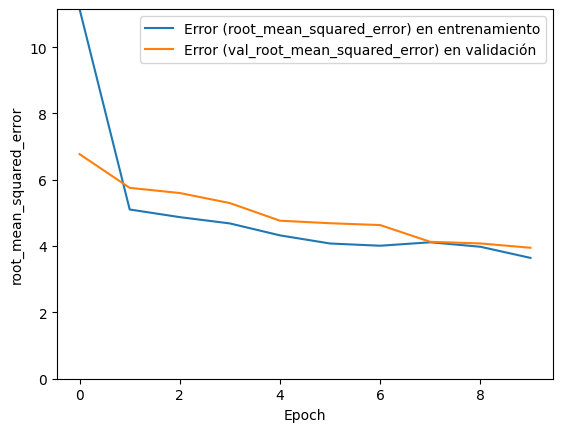

In [ ]:
plot_overfitting_check(model2_history, 'root_mean_squared_error')

In [ ]:
print("Máximo RMSE:",max(np.array(model2_history.history['val_root_mean_squared_error'])))
print("Mínimo RMSE:",min(np.array(model2_history.history['val_root_mean_squared_error'])))

Máximo RMSE: 6.772290229797363
Mínimo RMSE: 3.949775218963623


## Modelo 3: Transfer Learning empleando DenseNet

Para el tercer modelo se emplear transfer learning, en concreto se emplea el modelo DenseNet pre-entrenado con el dataset de ImageNet.

Como Keras tiene 3 implementaciones de DenseNet:
* DenseNet121
* DenseNet169
* DenseNet201

Donde la diferencia principal es la profuncidad del modelo, se decide implementar los 3 y escojer el mejor teniendo en cuenta los resultados, tiempo de entrenamiento y complegidad del modelo.

### Modelo con transfer learning usando DesneNet121

29084464/29084464 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  

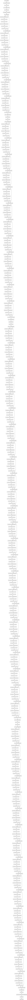

In [ ]:
# Cargamos el modelo DenseNet121 pre-entrenado con ImageNet
base_model = applications.DenseNet121(weights='imagenet', include_top=False, input_shape=(img_width,img_height, 3))

# Se dejan fijos los parámetros nativos del modelo para unicamente entrenar las capas nuevas
for layer in base_model.layers:
    layer.trainable = False   # por defecto, el valor de trainable es True

# Se añaden nuevas capas al final para adaptar el modelo al problema
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
# Se añade una última capa con una neurona para la salida de la regresion
predictions = Dense(1)(x)

# Se crea el modelo final
model3 = Model(inputs=[base_model.input], outputs=[predictions])
model3.summary()   # representación en modo texto del modelo
plot_model(model3, to_file='model3.png')

In [ ]:
initial_learning_rate = 0.0001
reduce_lr = ReduceLROnPlateau(monitor='val_root_mean_squared_error', factor=0.1, patience=2, min_lr=0.0000001, verbose=1,  min_delta=0.1)
# Se añade early stopping para evitar sobreajustes
early_stopping = EarlyStopping(monitor='val_root_mean_squared_error', patience=3, verbose=1,  min_delta=0.3)

model3.compile(optimizer=optimizers.Adam(learning_rate=initial_learning_rate), loss='mse', metrics=[RootMeanSquaredError()])

# Se entrena el modelo con los datos preparados
model3_history = model3.fit(train_generator,
          epochs=10,  # numero de epochs
          verbose=2,  # muestra informacion del error al finalizar cada epoch
          steps_per_epoch=len(train_data)/batch_size,
          validation_data=dev_generator,
          validation_steps=len(dev_data)/batch_size,
          callbacks=[early_stopping, reduce_lr])

# Por ultimo, se evalua el modelo en el conjunto de test
print()
test_loss3, test_acc3 = model3.evaluate(test_generator,
                                     steps=len(test_data)/batch_size,
                                     verbose=1)
print("test_loss: %.4f, test_acc: %.4f" % (test_loss3, test_acc3))

Epoch 1/10
44/44 - 170s - loss: 38.4353 - root_mean_squared_error: 6.1996 - val_loss: 27.8790 - val_root_mean_squared_error: 5.2801 - lr: 1.0000e-04 - 170s/epoch - 4s/step
Epoch 2/10
44/44 - 167s - loss: 16.7277 - root_mean_squared_error: 4.0900 - val_loss: 19.5819 - val_root_mean_squared_error: 4.4251 - lr: 1.0000e-04 - 167s/epoch - 4s/step
Epoch 3/10
44/44 - 165s - loss: 11.9926 - root_mean_squared_error: 3.4630 - val_loss: 14.4687 - val_root_mean_squared_error: 3.8038 - lr: 1.0000e-04 - 165s/epoch - 4s/step
Epoch 4/10
44/44 - 163s - loss: 9.3413 - root_mean_squared_error: 3.0563 - val_loss: 11.7474 - val_root_mean_squared_error: 3.4274 - lr: 1.0000e-04 - 163s/epoch - 4s/step
Epoch 5/10
44/44 - 165s - loss: 8.0642 - root_mean_squared_error: 2.8397 - val_loss: 10.3707 - val_root_mean_squared_error: 3.2204 - lr: 1.0000e-04 - 165s/epoch - 4s/step
Epoch 6/10
44/44 - 151s - loss: 7.0113 - root_mean_squared_error: 2.6479 - val_loss: 9.4570 - val_root_mean_squared_error: 3.0752 - lr: 1.0000

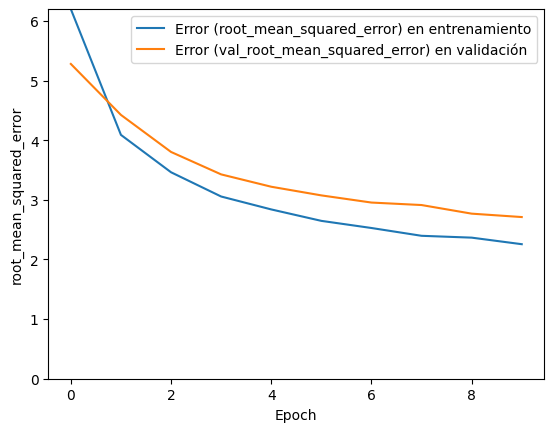

In [ ]:
plot_overfitting_check(model3_history, 'root_mean_squared_error')

In [ ]:
print("Máximo RMSE:",max(np.array(model3_history.history['val_root_mean_squared_error'])))
print("Mínimo RMSE:",min(np.array(model3_history.history['val_root_mean_squared_error'])))

Máximo RMSE: 5.280055522918701
Mínimo RMSE: 2.7118232250213623


### Modelo con transfer learning usando DesneNet169

51877672/51877672 [==============================] - 2s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d_2 (ZeroPadd  (None, 230, 230, 3)          0         ['input_2[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d_2[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati

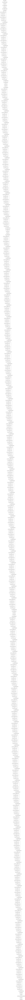

In [ ]:
# Se carga el modelo DenseNet169 pre-entrenado con ImageNet
base_model2 = applications.DenseNet169(weights='imagenet', include_top=False, input_shape=(img_width,img_height, 3))

# Se dejan fijos los parámetros nativos del modelo para unicamente entrenar las capas nuevas
for layer in base_model2.layers:
    layer.trainable = False   # por defecto, el valor de trainable es True

# Se añaden nuevas capas al final para adaptar el modelo al problema
x2 = base_model2.output
x2 = GlobalAveragePooling2D()(x2)
x2 = Dense(1024, activation='relu')(x2)
# Se añade una última capa con una neurona para la salida de la regresion
predictions2 = Dense(1)(x2)

# Se crea el modelo final
model4 = Model(inputs=[base_model2.input], outputs=[predictions2])
model4.summary()   # representación en modo texto del modelo
plot_model(model4, to_file='model4.png')

In [ ]:
initial_learning_rate = 0.0001
reduce_lr = ReduceLROnPlateau(monitor='val_root_mean_squared_error', factor=0.1, patience=2, min_lr=0.0000001, verbose=1,  min_delta=0.1)
# Se añade early stopping para evitar sobreajustes
early_stopping = EarlyStopping(monitor='val_root_mean_squared_error', patience=3, verbose=1,  min_delta=0.3)

model4.compile(optimizer=optimizers.Adam(learning_rate=initial_learning_rate), loss='mse', metrics=[RootMeanSquaredError()])

# Se entrena el modelo con los datos preparados
model4_history = model4.fit(train_generator,
          epochs=10,  # numero de epochs
          verbose=2,  # muestra informacion del error al finalizar cada epoch
          steps_per_epoch=len(train_data)/batch_size,
          validation_data=dev_generator,
          validation_steps=len(dev_data)/batch_size,
          callbacks=[early_stopping, reduce_lr])

# Por ultimo, se evalua el modelo en el conjunto de test
print()
test_loss4, test_acc4 = model4.evaluate(test_generator,
                                     steps=len(test_data)/batch_size,
                                     verbose=1)
print("test_loss: %.4f, test_acc: %.4f" % (test_loss4, test_acc4))

Epoch 1/10
44/44 - 189s - loss: 50.0948 - root_mean_squared_error: 7.0778 - val_loss: 28.2673 - val_root_mean_squared_error: 5.3167 - lr: 1.0000e-04 - 189s/epoch - 4s/step
Epoch 2/10
44/44 - 184s - loss: 16.0389 - root_mean_squared_error: 4.0049 - val_loss: 18.3483 - val_root_mean_squared_error: 4.2835 - lr: 1.0000e-04 - 184s/epoch - 4s/step
Epoch 3/10
44/44 - 181s - loss: 10.9423 - root_mean_squared_error: 3.3079 - val_loss: 13.2736 - val_root_mean_squared_error: 3.6433 - lr: 1.0000e-04 - 181s/epoch - 4s/step
Epoch 4/10
44/44 - 180s - loss: 8.3910 - root_mean_squared_error: 2.8967 - val_loss: 10.5346 - val_root_mean_squared_error: 3.2457 - lr: 1.0000e-04 - 180s/epoch - 4s/step
Epoch 5/10
44/44 - 186s - loss: 6.9032 - root_mean_squared_error: 2.6274 - val_loss: 9.0219 - val_root_mean_squared_error: 3.0037 - lr: 1.0000e-04 - 186s/epoch - 4s/step
Epoch 6/10
44/44 - 180s - loss: 6.1633 - root_mean_squared_error: 2.4826 - val_loss: 8.9735 - val_root_mean_squared_error: 2.9956 - lr: 1.0000e

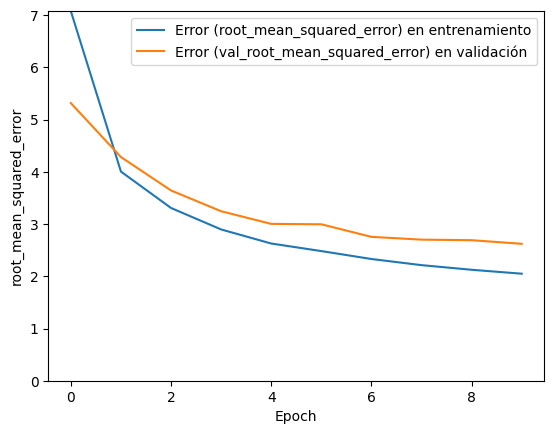

In [ ]:
plot_overfitting_check(model4_history, 'root_mean_squared_error')

In [ ]:
print("Máximo RMSE:",max(np.array(model4_history.history['val_root_mean_squared_error'])))
print("Mínimo RMSE:",min(np.array(model4_history.history['val_root_mean_squared_error'])))

Máximo RMSE: 5.316699504852295
Mínimo RMSE: 2.621958017349243


### Modelo con transfer learning usando DesneNet201

74836368/74836368 [==============================] - 3s 0us/step
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d_4 (ZeroPadd  (None, 230, 230, 3)          0         ['input_3[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d_4[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati

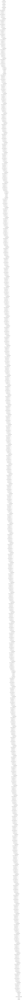

In [ ]:
# Se carga el modelo DenseNet201 pre-entrenado con ImageNet
base_model3 = applications.DenseNet201(weights='imagenet', include_top=False, input_shape=(img_width,img_height, 3))

# Se dejan fijos los parámetros nativos del modelo para unicamente entrenar las capas nuevas
for layer in base_model3.layers:
    layer.trainable = False   # por defecto, el valor de trainable es True

# Se añaden nuevas capas al final para adaptar el modelo al problema
x3 = base_model3.output
x3 = GlobalAveragePooling2D()(x3)
x3 = Dense(1024, activation='relu')(x3)
# Se añade una última capa con una neurona para la salida de la regresion
predictions3 = Dense(1)(x3)

# Se crea el modelo final
model5 = Model(inputs=[base_model3.input], outputs=[predictions3])
model5.summary()   # representación en modo texto del modelo
plot_model(model5, to_file='model5.png')

In [ ]:
initial_learning_rate = 0.0001
reduce_lr = ReduceLROnPlateau(monitor='val_root_mean_squared_error', factor=0.1, patience=2, min_lr=0.0000001, verbose=1,  min_delta=0.1)
# Se añade early stopping para evitar sobreajustes
early_stopping = EarlyStopping(monitor='val_root_mean_squared_error', patience=3, verbose=1,  min_delta=0.3)

model5.compile(optimizer=optimizers.Adam(learning_rate=initial_learning_rate), loss='mse', metrics=[RootMeanSquaredError()])

# Se entrena el modelo con los datos preparados
model5_history = model5.fit(train_generator,
          epochs=10,  # numero de epochs
          verbose=2,  # muestra informacion del error al finalizar cada epoch
          steps_per_epoch=len(train_data)/batch_size,
          validation_data=dev_generator,
          validation_steps=len(dev_data)/batch_size,
          callbacks=[early_stopping, reduce_lr])

# Por ultimo, se evalua el modelo en el conjunto de test
print()
test_loss5, test_acc5 = model5.evaluate(test_generator,
                                     steps=len(test_data)/batch_size,
                                     verbose=1)
print("test_loss: %.4f, test_acc: %.4f" % (test_loss5, test_acc5))

Epoch 1/10
44/44 - 245s - loss: 45.5447 - root_mean_squared_error: 6.7487 - val_loss: 27.0760 - val_root_mean_squared_error: 5.2035 - lr: 1.0000e-04 - 245s/epoch - 5s/step
Epoch 2/10
44/44 - 228s - loss: 16.8180 - root_mean_squared_error: 4.1010 - val_loss: 18.4205 - val_root_mean_squared_error: 4.2919 - lr: 1.0000e-04 - 228s/epoch - 5s/step
Epoch 3/10
44/44 - 226s - loss: 11.7374 - root_mean_squared_error: 3.4260 - val_loss: 12.8815 - val_root_mean_squared_error: 3.5891 - lr: 1.0000e-04 - 226s/epoch - 5s/step
Epoch 4/10
44/44 - 224s - loss: 8.6777 - root_mean_squared_error: 2.9458 - val_loss: 10.0069 - val_root_mean_squared_error: 3.1634 - lr: 1.0000e-04 - 224s/epoch - 5s/step
Epoch 5/10
44/44 - 229s - loss: 7.2800 - root_mean_squared_error: 2.6981 - val_loss: 8.4471 - val_root_mean_squared_error: 2.9064 - lr: 1.0000e-04 - 229s/epoch - 5s/step
Epoch 6/10
44/44 - 264s - loss: 6.5972 - root_mean_squared_error: 2.5685 - val_loss: 7.6882 - val_root_mean_squared_error: 2.7728 - lr: 1.0000e

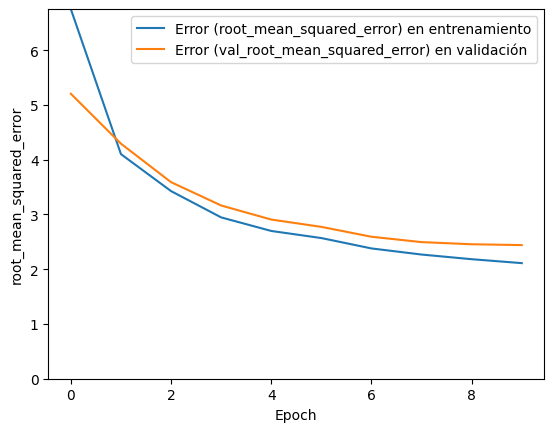

In [ ]:
plot_overfitting_check(model5_history, 'root_mean_squared_error')

In [ ]:
print("Máximo RMSE:",max(np.array(model5_history.history['val_root_mean_squared_error'])))
print("Mínimo RMSE:",min(np.array(model5_history.history['val_root_mean_squared_error'])))

Máximo RMSE: 5.203455448150635
Mínimo RMSE: 2.4398505687713623


## Test de los modelos

Una vez entrenados los modelos se pueden hacer comprobaciones con los datos para comprobare de forma empirica el rendimiento de los modelos.

Para ello, se escogerá un numero de imagenes aleatorias del conjunto de Test y se usarán los modelos para determinar el porcentaje de ocupacion de pixeles de comida en las misma, esta prediciccion se comparará con el valor real.

In [ ]:
sample_size = 5  # Tamaño de la mustra a testear
sample_images = test_data['image_name'].sample(n=sample_size, random_state=10).tolist()

In [ ]:
# Se cargan y se procesan las imagenes
preprocessed_images = []
for image_name in sample_images:
    img_path = images_path + image_name
    img = load_img(img_path, target_size=(img_width, img_height))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0  # Se normalizan según la escala utilizada durante el entrenamiento
    preprocessed_images.append(img_array)
preprocessed_images = np.vstack(preprocessed_images)

In [ ]:
# Se obtienen las predicciones de los modelos entrenados
predictions1 = model.predict(preprocessed_images)
predictions2 = model2.predict(preprocessed_images)
predictions3 = model4.predict(preprocessed_images)

1/1 [==============================] - 4s 4s/step


In [ ]:
# Se crea una función para visualizar las imágenes y predicciones

def prediction_check(sample_images, preprocessed_images, test_data, predictions):
  for i in range(len(sample_images)):
      # Imagen original
      plt.figure(figsize=(15, 5))
      plt.subplot(1, 3, 1)
      plt.imshow(preprocessed_images[i])
      plt.title('Imagen Original: ' + sample_images[i])

      # Porcentajes
      real_percentage = test_data[test_data['image_name'] == sample_images[i]]['food_pixels'].values[0]
      plt.subplot(1, 3, 2)
      plt.text(0.5, 0.5, f'Real: {real_percentage} %', fontsize=12, ha='center', va='center')
      plt.axis('off')
      plt.title('Porcentaje Real')

      plt.subplot(1, 3, 3)
      plt.text(0.5, 0.5, f'Predicción: {predictions[i][0]} %', fontsize=12, ha='center', va='center')
      plt.axis('off')
      plt.title('Porcentaje Predicho')

      plt.show()

Comprobacion Modelo 1:


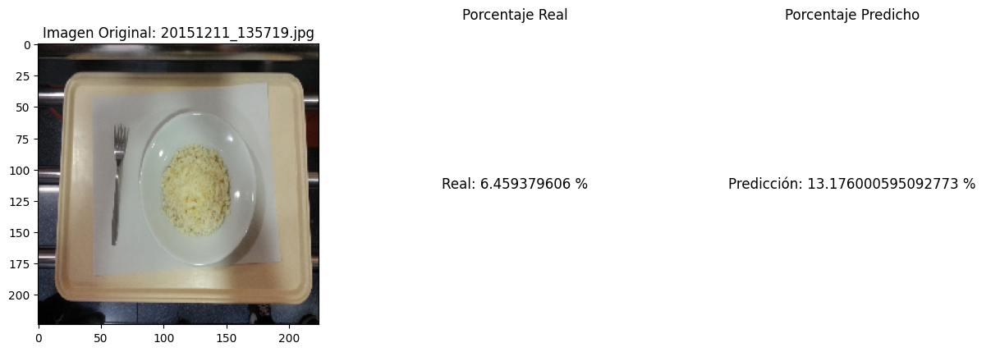

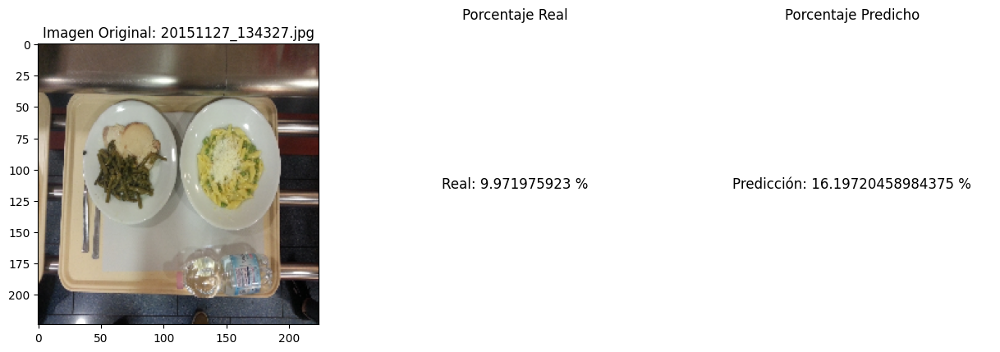

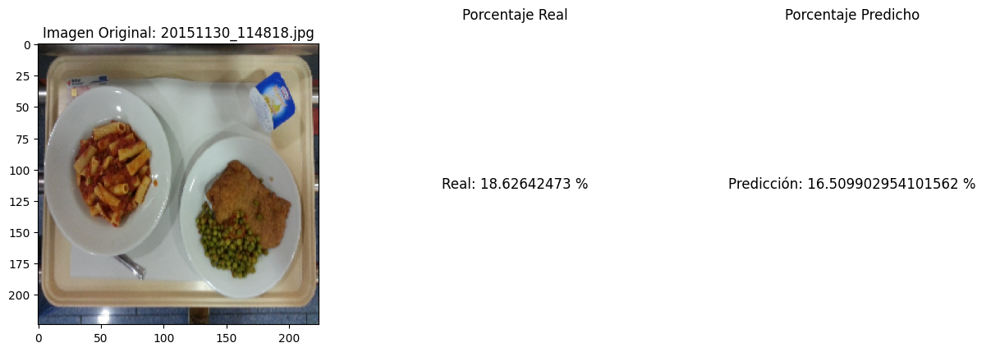

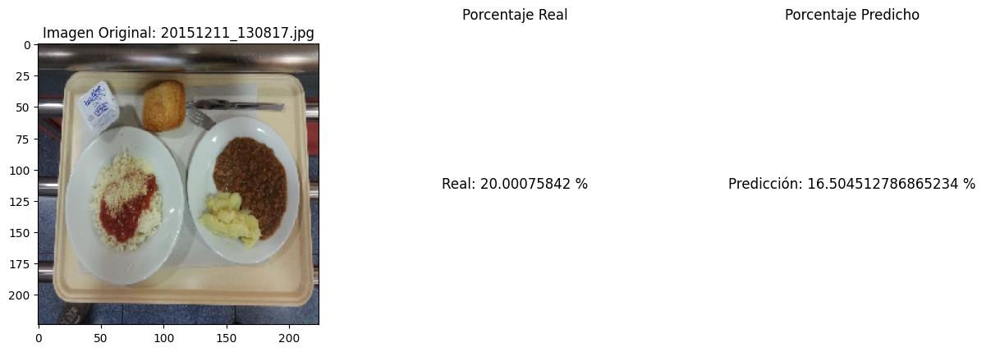

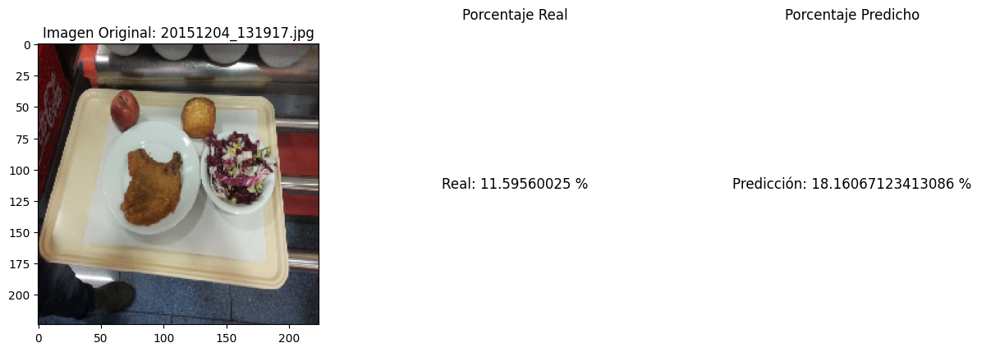

Comprobacion Modelo 2:


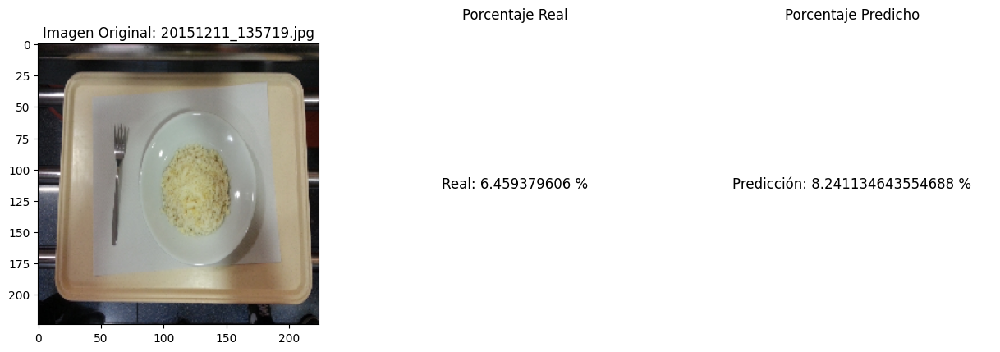

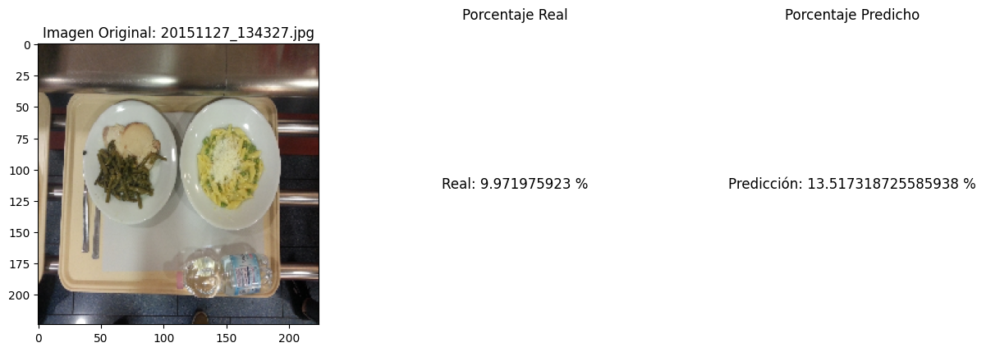

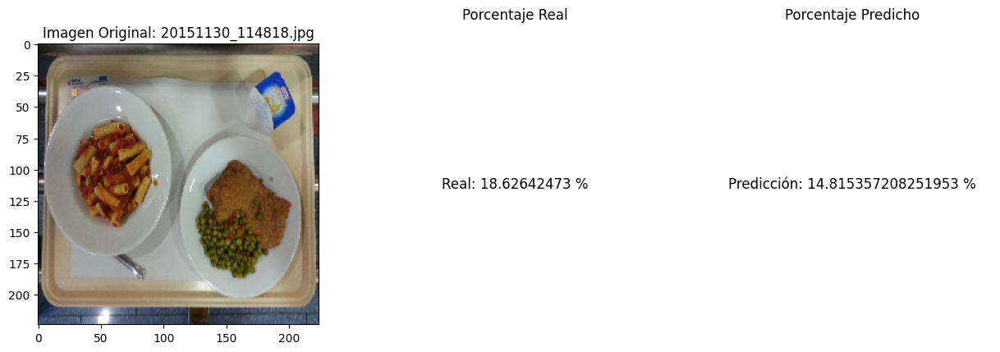

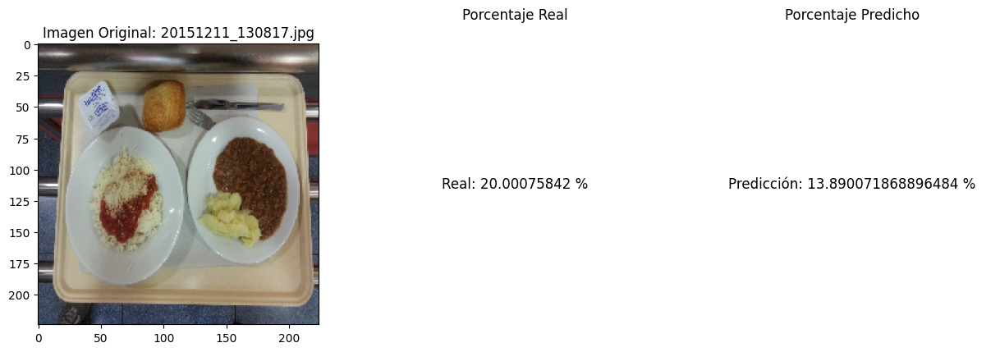

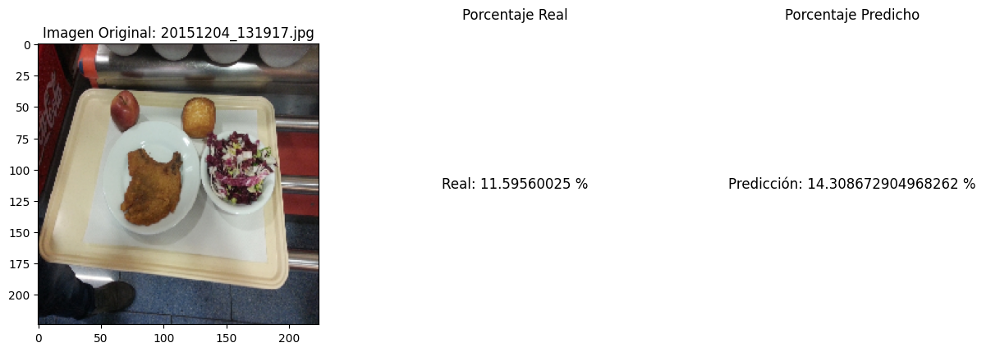

Comprobacion Modelo 3:


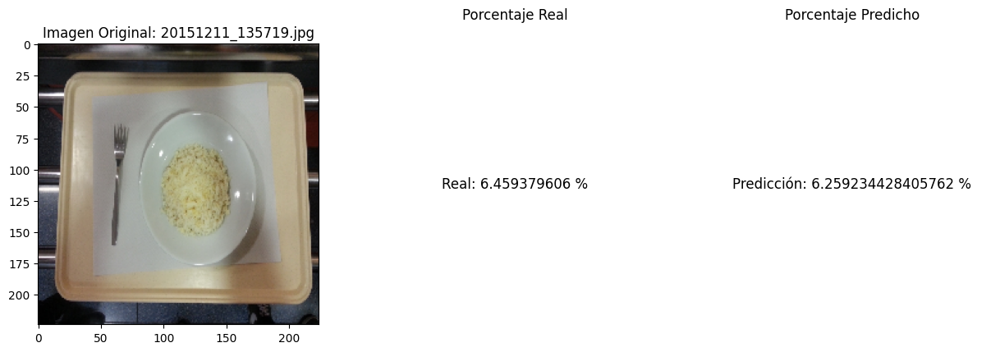

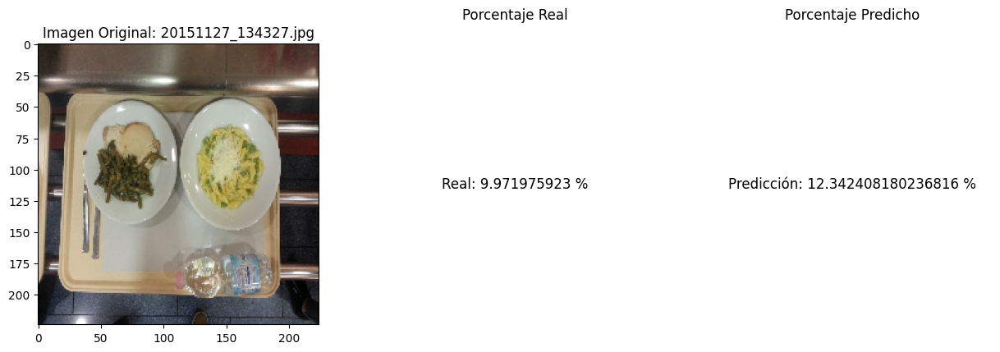

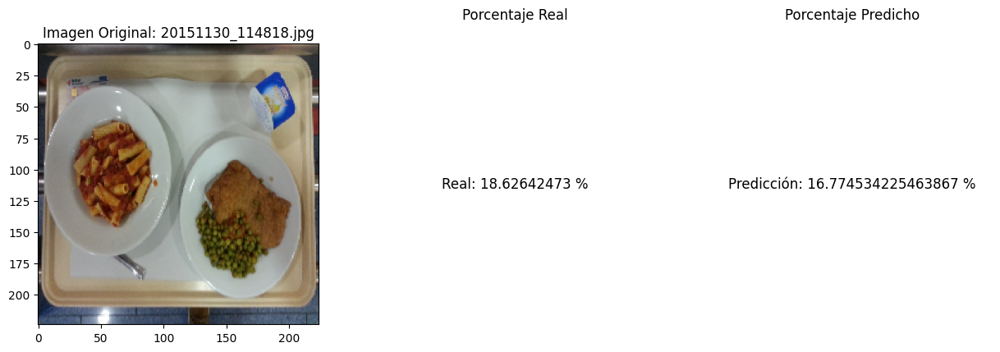

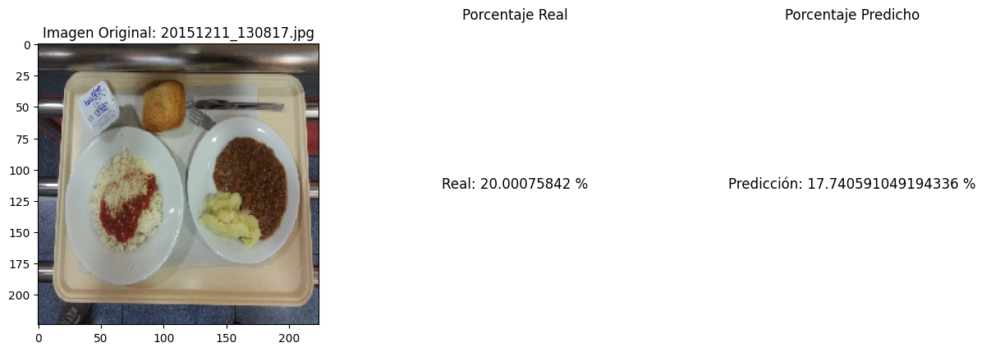

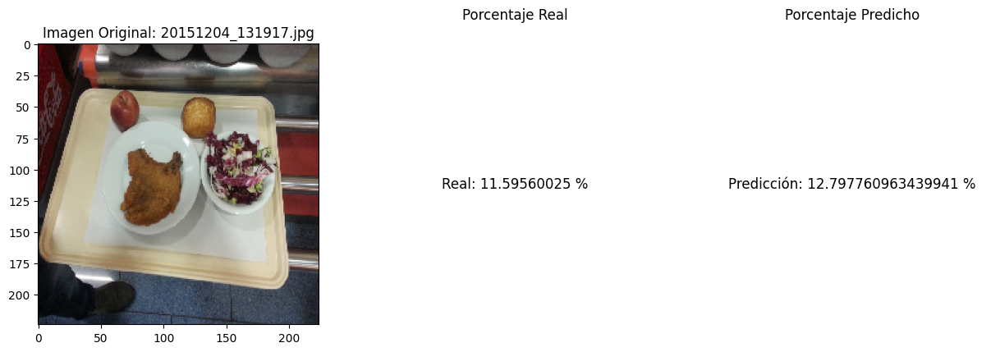

In [ ]:
print("Comprobacion Modelo 1:")
prediction_check(sample_images, preprocessed_images, test_data, predictions1)

print("Comprobacion Modelo 2:")
prediction_check(sample_images, preprocessed_images, test_data, predictions2)

print("Comprobacion Modelo 3:")
prediction_check(sample_images, preprocessed_images, test_data, predictions3)